In [ ]:
# Helper packages
import numpy as np
from PIL import Image
from pathlib import Path
from tqdm.notebook import tqdm
import matplotlib.pyplot as plt
from skimage.color import rgb2lab, lab2rgb
import glob
import opendatasets as od
import os 
from scipy import linalg
import random
import datetime
Path.ls = lambda x: list(x.iterdir())
# import dataset
# AI packages
import torch
from torch import nn, optim
from torchvision import transforms
from torchvision.utils import make_grid
from torch.utils.data import Dataset, DataLoader, SubsetRandomSampler
import torch.nn.functional as F
from torchvision.models import inception_v3
from skimage.metrics import structural_similarity as compare_ssim
import cv2
import torchvision.models as models
import multiprocessing as mp
from fastai.vision.learner import create_body
from torchvision.models.resnet import resnet18
from fastai.vision.models.unet import DynamicUnet

multi_gpu_DP = False
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print(torch.cuda.is_available())

In [ ]:
# !pip install opendatasets

# Configurations


In [ ]:
# dataset_url = 'https://www.kaggle.com/datasets/benjaminkz/places365'
# dataset_url = 'https://www.kaggle.com/datasets/azeez289999/gans-project-files'
# od.download(dataset_url)

In [ ]:
multi_gpu_DP = False                                        # If you have multi GPU on same machine make it True
kaggle = False


# Datasets
dataset_path = "FineTuning_Places\Place1_room\High\*.*"     # We are using glob so if images in several folders or multi extentions make it /*.*
DATASET_SIZE = 1000000                                     # Dataset images size
VAL_SIZE = DATASET_SIZE * 0.1
SIZE = 512                                                 # Images size (SIZExSIZE)

# Dataloader configurations
N_WORKERS = mp.cpu_count() - 1
BATCH_SIZE = 24                                           # Note: if you have two GPUS each will have 16
SHUFFLE = True
TRAIN_SPLIT = 'train'
VAL_SPLIT = 'val'

# Generator Configurations
LR_G = 2e-4
DROPOUT = False

# Model Configuration Parameters
LR_G = 2e-4
LR_D = 2e-4
BETA1 = 0.5
BETA2 = 0.999
LAMBDA_L1 = 100.

# Training
TRAIN = True                                        # If you want to train new model make it true
EPOCH = 100
display_every = (DATASET_SIZE / BATCH_SIZE) - 10    # Display model loss, and results at last of each epoch
Save_display = True
save_model_every = 1800                                   # Save model with timestamp every x seconds
gen_epoch = 20

# pretrain Generator (new appraoch)
TRAIN_GENERATOR = True
Load_Pretrained_Generator = False                           # If you already pretrained generator and want to load it only
# pretrained_generator_path = "checkpoints/gen_checkpoint_20230919_044556.pt"
pretrained_model_path = 'checkpoints/model_checkpoint_20230919_065217_MPHUMAN.pt'

#Fintune
Do_Finetune = False

# Deploy
Deploy_to_onnx = False
Deploy_to_TensorRT = False

net_G_ONNX_path = "Final_net_G.onnx"
model_ONNX_path = "Final_model.onnx"

# Inference
Test_images_dir = "FineTuning_Places\Place1_room\High\*.*" 

# Metrics Evaluation
base_directory = dataset_path  # Replace with your directory path
Test_number_images = 48

# Setting seed for recreation
np.random.seed(100)

# Machine Analysis

In [ ]:
!nvidia-smi

In [ ]:
# importing helper functions
if kaggle:
    from shutil import copyfile
    copyfile(src = "../input/helper/helpers.py", dst = "../working/helpers.py")
    from helpers import *
else:
    from helpers import *

In [ ]:
# Selecting training device
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

# dataset path
paths = glob.glob(dataset_path)

if kaggle:
    with open('places365/train.txt', 'r') as file: # much faster than glob
        paths = [line.strip() for line in file]
    prefix = 'places365/'
    paths = [prefix + path for path in paths]

# choosing 3000 images randomly
paths_subset = np.random.choice(paths, DATASET_SIZE, replace=False)

# # generating random indices for train/validation
rand_idxs = np.random.permutation(DATASET_SIZE)
train_idxs = rand_idxs[:-int(VAL_SIZE)] # first 4500 images
val_idxs = rand_idxs[-int(VAL_SIZE):] # last 500 images

# # selecting train/validation paths
train_paths = paths_subset[train_idxs]
val_paths = paths_subset[val_idxs]

print(f"Training images:{len(train_paths)} | Validation images:{len(val_paths)}")

In [ ]:
# Data Generator Class
class ColorizationDataset(Dataset):
    def __init__(self, paths, split='train'):
        # Creating Data Transformers
        if split == 'train':
            self.transforms = transforms.Compose([
                transforms.Resize((SIZE, SIZE)),
                transforms.RandomHorizontalFlip() # Data augmentation
            ])
        elif split == 'val': # NO AUGMENTATION IN VALIDATION
            self.transforms = transforms.Resize((SIZE, SIZE))

        # object variables
        self.size = SIZE
        self.split = split
        self.paths = paths

    # Image list accessing method
    def __getitem__(self, idx):
        while True:  # Keep trying until a valid image is found or all images are exhausted
            try:
                img = Image.open(self.paths[idx]).convert("RGB")
                break  # If this line is reached, the image was successfully opened
            except FileNotFoundError:
                # If an image is not found, move to the next image
                idx = (idx + 1) % len(self.paths)
        # transform image using object transformer [train/val]
        img = self.transforms(img)
        # converting image to L*a*b formate tensors
        img = np.array(img)
        img_lab = rgb2lab(img).astype("float32")
        img_lab = transforms.ToTensor()(img_lab)
        # rescaling images to range from [-1, 1]
        L = img_lab[[0], ...] / 50. - 1.
        ab = img_lab[[1, 2], ...] / 110.

        return {'L': L, 'ab': ab}

    def __len__(self):
        return len(self.paths)

# Dataloader function
def make_dataloaders(batch_size=16, n_workers=4, pin_memory=True, distributed=False, sampler=None, shuffle=False, **kwargs):
    """ Create dataloader of passed path

    Args:
        batch_size: generator batch size. Defaults to 16.
        n_workers: processor workers. Defaults to 4.
        pin_memory: move data to device/CUDA. Defaults to True.

    Returns:
        dataloader
    """
    dataset = ColorizationDataset(**kwargs)

    dataloader = DataLoader(dataset, batch_size=batch_size, num_workers=n_workers, shuffle=shuffle, pin_memory=pin_memory, sampler=sampler)
    return dataloader

In [ ]:
# Create dataloaders
train_dl = make_dataloaders(batch_size=BATCH_SIZE, paths=train_paths, n_workers=0, split=TRAIN_SPLIT,shuffle=SHUFFLE)
val_dl = make_dataloaders(batch_size=BATCH_SIZE, paths=val_paths, n_workers=0, split=VAL_SPLIT)

# Printing data shapes
dataiter = next(iter(train_dl))
Ls, abs_ = dataiter['L'], dataiter['ab']
print(f"L's Shape:{Ls.shape} | ab's Shape:{abs_.shape}")
print(f"Training batches:{len(train_dl)} | Validation batches:{len(val_dl)}")

# Creating Model
___
### Model Architecture


### Generator Component

In [ ]:
class Generator(nn.Module):
    def __init__(self, lr_G=LR_G, dropout=DROPOUT):
        super(Generator, self).__init__()

        # Down sampling
        self.layer1_down = nn.Conv2d(1, 64, kernel_size=4, stride=2, padding=1, bias=False)  # 128x128
        self.layer2_down = self._make_layer_down(64, 128, 4, 2, 1, False)                    # 64x64
        self.layer3_down = self._make_layer_down(128, 256, 4, 2, 1, False)                   # 32x32
        self.layer4_down = self._make_layer_down(256, 512, 4, 2, 1, False)                   # 16x16
        self.layer5_down = self._make_layer_down(512, 512, 4, 2, 1, False)                   # 8x8
        self.layer6_down = self._make_layer_down(512, 512, 4, 2, 1, False)                   # 4x4
        self.layer7_down = self._make_layer_down(512, 512, 4, 2, 1, False)                   # 2x2

        # Connector
        self.layer8_middle = nn.Sequential(nn.LeakyReLU(0.2, True),
                                           nn.Conv2d(512, 512, 4, 2, 1, bias=False),         # 1x1
                                           nn.ReLU(True),
                                           nn.ConvTranspose2d(512, 512, 4, 2, 1, bias=False),# 2x2
                                           nn.BatchNorm2d(512))

        # Up sampling
        self.layer9_up = self._make_layer_up(1024, 512, 4, 2, 1, False, True)              # 4x4
        self.layer10_up = self._make_layer_up(1024, 512, 4, 2, 1, False, True)             # 8x8
        self.layer11_up = self._make_layer_up(1024, 512, 4, 2, 1, False, True)             # 16x16
        self.layer12_up = self._make_layer_up(1024, 256, 4, 2, 1, False, False)            # 32x32
        self.layer13_up = self._make_layer_up(512, 128, 4, 2, 1, False, False)             # 64x64
        self.layer14_up = self._make_layer_up(256, 64, 4, 2, 1, False, False)              # 128x128

        # Output layer
        self.layer15_up = nn.Sequential(nn.ReLU(True),
                                        nn.ConvTranspose2d(128, 2, 4, 2, 1),               # 256x256
                                        nn.Tanh())


    def _make_layer_down(self, in_c, out_c, kernel, stride, padding, bias=False):
        layers = []
        # Leaky ReLU
        layers.append(nn.LeakyReLU(0.2, True))
        # 2D convolution layer
        layers.append(nn.Conv2d(in_c, out_c, kernel_size=kernel,
                                stride=stride, padding=padding, bias=bias))
        # Batch normalization
        layers.append(nn.BatchNorm2d(num_features=out_c))
        return nn.Sequential(*layers)

    def _make_layer_up(self, in_c, out_c, kernel, stride, padding, bias=False, dropout=False):
        layers = []
        # Leaky ReLU
        layers.append(nn.ReLU(True))
        # 2D convolution layer
        layers.append(nn.ConvTranspose2d(in_c, out_c, kernel_size=kernel,
                                         stride=stride, padding=padding, bias=bias))
        # Batch normalization
        layers.append(nn.BatchNorm2d(num_features=out_c))
        if dropout: layers.append(nn.Dropout())
        return nn.Sequential(*layers)

    def forward(self, x):
        # store skip connections of U-NET architecture
        skip_connections = []

        # Down sampling
        x = self.layer1_down(x)
        skip_connections.append(x)
        x = self.layer2_down(x)
        skip_connections.append(x)
        x = self.layer3_down(x)
        skip_connections.append(x)
        x = self.layer4_down(x)
        skip_connections.append(x)
        x = self.layer5_down(x)
        skip_connections.append(x)
        x = self.layer6_down(x)
        skip_connections.append(x)
        x = self.layer7_down(x)
        skip_connections.append(x)

        # bottleneck
        x = self.layer8_middle(x)
        skip_connections = skip_connections[::-1]   # reversing list

        # Up sampling
        x = self.layer9_up(torch.cat([skip_connections.pop(0), x], dim=1))
        x = self.layer10_up(torch.cat([skip_connections.pop(0), x], dim=1))
        x = self.layer11_up(torch.cat([skip_connections.pop(0), x], dim=1))
        x = self.layer12_up(torch.cat([skip_connections.pop(0), x], dim=1))
        x = self.layer13_up(torch.cat([skip_connections.pop(0), x], dim=1))
        x = self.layer14_up(torch.cat([skip_connections.pop(0), x], dim=1))
        x = self.layer15_up(torch.cat([skip_connections.pop(0), x], dim=1))

        return x

In [ ]:
class GANLoss(nn.Module):
    def __init__(self, real_label=1.0, fake_label=0.0):
        super().__init__()
        self.register_buffer('real_label', torch.tensor(real_label))
        self.register_buffer('fake_label', torch.tensor(fake_label))
        self.loss = nn.BCEWithLogitsLoss()

    def get_labels(self, preds, target_is_real):
        if target_is_real:
            labels = self.real_label
        else:
            labels = self.fake_label
        return labels.expand_as(preds)

    def __call__(self, preds, target_is_real):
        labels = self.get_labels(preds, target_is_real)
        loss = self.loss(preds, labels)
        return loss

### Discriminator Component

In [ ]:
class Discriminator(nn.Module):
    def __init__(self):
        super(Discriminator, self).__init__()

        self.layer1 = self._make_layer(3, 64, 4, 2, 1, norm=False, act=True)    # 128x128
        self.layer2 = self._make_layer(64, 128, 4, 2, 1, norm=True, act=True)   # 64x64
        self.layer3 = self._make_layer(128, 256, 4, 2, 1, norm=True, act=True)  # 32x32
        self.layer4 = self._make_layer(256, 512, 4, 1, 1, norm=True, act=True)  # 16x16
        self.layer5 = self._make_layer(512, 1, 4, 1, 1, norm=False, act=False)  # 16X16


    def _make_layer(self, in_c, out_c, kernel,stride, padding, norm=True, act=True):
        layers = []
        # 2D convolution layer
        layers.append(nn.Conv2d(in_c, out_c, kernel, stride, padding, bias=not norm))
        # Batch normalization
        if norm: layers.append(nn.BatchNorm2d(out_c))
        # Activation function
        if act: layers.append(nn.LeakyReLU(0.2, True))
        return nn.Sequential(*layers)

    def forward(self, x):
        x = self.layer1(x)
        x = self.layer2(x)
        x = self.layer3(x)
        x = self.layer4(x)
        x = self.layer5(x)
        return x

# Combining Model Components

* ### Weight Initialization Function

In [ ]:
def init_weights(net, gain=0.02):

    # weight initializing function
    def init_func(m):
        classname = m.__class__.__name__
        if hasattr(m, 'weight') and 'Conv' in classname:
            # initialize layer weights
            nn.init.normal_(m.weight.data, mean=0.0, std=gain)
            # initialize layer bias
            if hasattr(m, 'bias') and m.bias is not None:
                nn.init.constant_(m.bias.data, 0.0)
        elif 'BatchNorm2d' in classname:
            nn.init.normal_(m.weight.data, 1., gain)
            nn.init.constant_(m.bias.data, 0.)

    # initialize model weights
    net.apply(init_func)
    return net

def init_model(model, device):
    model = init_weights(model)

    # If multiple GPUs are available, wrap the model with DataParallel
    if torch.cuda.device_count() > 1 and multi_gpu_DP == True:
        print("Using", torch.cuda.device_count(), "GPUs!")
        print(torch.cuda.current_device())

        model = nn.DataParallel(model)

    # Move model to device and initialize its weights1
    model = model.to(device)
    return model

* ### Model Class

In [ ]:
class Model(nn.Module):
    def __init__(self, net_G=None, lr_G=LR_G, lr_D=LR_D, beta1=BETA1, beta2=BETA2, lambda_L1=LAMBDA_L1):
        super().__init__()

        # Selecting training device
        self.device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
        self.lambda_L1 = lambda_L1

        # Creating Generator
        if net_G is None:
            self.net_G = init_model(Generator(dropout=False), self.device)
        else:
            self.net_G = net_G.to(self.device)

        # Creating Discriminator
        self.net_D = init_model(Discriminator(), self.device)

        # Initializing GAN loss functions (criterion)
        self.GANcriterion = GANLoss().to(self.device)
        self.L1criterion = nn.L1Loss()

        # Initializing optimizers for G an D
        self.opt_G = optim.Adam(self.net_G.parameters(), lr=lr_G, betas=(beta1, beta2))
        self.opt_D = optim.Adam(self.net_D.parameters(), lr=lr_D, betas=(beta1, beta2))

    def set_requires_grad(self, model, requires_grad=True):
        # Turn gradient on for parameters
        for p in model.parameters():
            p.requires_grad = requires_grad

    def setup_input(self, data):
        # Split input into correct layers
        self.L = data['L'].to(self.device)
        self.ab = data['ab'].to(self.device)

    def forward(self):
        # Generate fake image
        self.fake_color = self.net_G(self.L)

    def backward_D(self):
        # Calculate loss for discriminator for optimizer step

        # Combine grayscale image "L" with generated colors "a, b"
        fake_image = torch.cat([self.L, self.fake_color], dim=1)

        # Get discriminator prediction and loss for fake image
        fake_preds = self.net_D(fake_image.detach())
        self.loss_D_fake = self.GANcriterion(fake_preds, False)

        # Get discriminator prediction and loss for real image
        real_image = torch.cat([self.L, self.ab], dim=1)
        real_preds = self.net_D(real_image)
        self.loss_D_real = self.GANcriterion(real_preds, True)

        # Calculate Total Loss
        self.loss_D = (self.loss_D_fake + self.loss_D_real) * 0.5
        self.loss_D.backward()

    def backward_G(self):
        # Calculate loss for generator for optimizer step

        # Combine grayscale image "L" with generated colors "a, b"
        fake_image = torch.cat([self.L, self.fake_color], dim=1)

        # Get discriminator prediction and loss for fake image
        fake_preds = self.net_D(fake_image)

        # Calculate GAN/L1 loss
        self.loss_G_GAN = self.GANcriterion(fake_preds, True)
        self.loss_G_L1 = self.L1criterion(self.fake_color, self.ab) * self.lambda_L1

        # Calculate Total Loss
        self.loss_G = self.loss_G_GAN + self.loss_G_L1
        self.loss_G.backward()

    def optimize(self):
        # Update gradient based on loss values for G & D

        # Training Discriminator
        self.forward()
        self.net_D.train()
        self.set_requires_grad(self.net_D, True)
        self.opt_D.zero_grad()
        self.backward_D()
        self.opt_D.step()

        # Training Generator
        self.net_G.train()
        self.set_requires_grad(self.net_D, False)
        self.opt_G.zero_grad()
        self.backward_G()
        self.opt_G.step()

# Initializing model

In [ ]:
model = Model()
model

# Training the Model

In [ ]:
def train_model(model, train_dl, epochs, Save_display=False ):
    data = next(iter(val_dl)) # getting a batch for visualizing the model output after fixed intrvals

    for e in range(epochs):
        loss_meter_dict = create_loss_meters() # function returing a dictionary of objects to
        i = 0                                  # log the losses of the complete network
        for data in tqdm(train_dl):
            model.setup_input(data)
            model.optimize()

            update_losses(model, loss_meter_dict, count=data['L'].size(0)) # function updating the log objects
            i += 1

        if TRAIN :  
            torch.save(model.state_dict(), f"model_checkpoint_{e}_{datetime.datetime.now():%Y%m%d_%H%M%S}.pt")
        elif Do_Finetune:
            torch.save(model.state_dict(), f"model_checkpoint_Finetune_{e}_{datetime.datetime.now():%Y%m%d_%H%M%S}.pt")



        print(f"\nEpoch {e+1}/{epochs}")
        print(f"Iteration {i}/{len(train_dl)}")
        log_results(loss_meter_dict) # function to print out the losses
        visualize(model, data, epoch=e, save=Save_display) # function displaying the model's outputs`

# preTraining generator on Resnet18

In [ ]:
def build_res_unet(n_input=1, n_output=2, size=512):
    device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
    body = create_body(resnet18(pretrained=True), n_in=n_input, cut=-2)
    net_G = DynamicUnet(body, n_output, (size, size))
    if multi_gpu_DP == True:
        net_G = nn.DataParallel(net_G).to(device)
    else:
        net_G = net_G.to(device)
    return net_G

In [ ]:
def pretrain_generator(net_G, train_dl, opt, criterion, epochs):

    for e in range(epochs):
        loss_meter = AverageMeter()
        for data in tqdm(train_dl):
            L, ab = data['L'].to(device), data['ab'].to(device)  # Move data to the correct device
            preds = net_G(L)
            loss = criterion(preds, ab)
            opt.zero_grad()
            loss.backward()
            opt.step()

            loss_meter.update(loss.item(), L.size(0))

        print(f"Epoch {e + 1}/{epochs}")
        print(f"L1 Loss: {loss_meter.avg:.5f}")


        # Check elapsed time since the last model save

        torch.save(net_G.state_dict(), f"gen_checkpoint_{e}_{datetime.datetime.now():%Y%m%d_%H%M%S}.pt")


In [ ]:
if TRAIN_GENERATOR and not Load_Pretrained_Generator:
    net_G = build_res_unet(n_input=1, n_output=2, size=256)
    # net_G.load_state_dict(torch.load(pretrained_generator_path, map_location=device) # to load pretrain one un comment this
    opt = optim.Adam(net_G.parameters(), lr=1e-4)
    criterion = nn.L1Loss()

    pretrain_generator(net_G, train_dl, opt, criterion, gen_epoch)
    torch.save(net_G.state_dict(), "res18-unet.pt")

# Train model with pretrained Generator

In [ ]:
if Load_Pretrained_Generator:
    net_G = build_res_unet(n_input=1, n_output=2, size=256)
    # net_G.load_state_dict(torch.load(pretrained_generator_path, map_location=device))


if TRAIN:
    model = Model(net_G=net_G)
    train_model(model, train_dl, EPOCH, Save_display)
    torch.save(model.state_dict(), "model_last.pt")

# Finetune

In [ ]:
if Do_Finetune:
    # Load the pre-trained generator
    net_G = build_res_unet(n_input=1, n_output=2, size=256)
    # net_G.load_state_dict(torch.load(pretrained_generator_path))

    # Create the Model instance using the loaded generator
    Finetune = Model(net_G=net_G)

    # Load the saved state dictionary into the model instance
    pretrained_model = torch.load(pretrained_model_path)
    Finetune.load_state_dict(pretrained_model)


    # Train the model
    display_every = 5
    train_model(Finetune, train_dl, EPOCH,  Save_display=False)

In [ ]:
torch.cuda.is_available()

# Deployments to TensorRT
- Export net_g and model to ONNX
- on JETSON nano Convert ONNX to TensorRT

## Export to ONNX

In [ ]:
print(type(net_G))
print(type(net_G.module))

In [ ]:
# model.eval()

In [ ]:
if Deploy_to_onnx:
    net_G = build_res_unet(n_input=1, n_output=2, size=256).to("cuda")

    dummy_input = torch.randn(1, 1, 256, 256).to("cuda")  # adjust the input dimensions and channels accordingly

    model = Model(net_G=net_G).to("cuda")
    pretrained_model = torch.load(pretrained_model_path)
    model.load_state_dict(pretrained_model)


    # Export the TorchScript model to ONNX
    torch.onnx.export(model, dummy_input, "Final_model.onnx")


## Export to TensorRT
- Must be on Jetson nano

In [ ]:
def build_trt_engine(onnx_path):
    TRT_LOGGER = trt.Logger(trt.Logger.WARNING)
    with trt.Builder(TRT_LOGGER) as builder, builder.create_network() as network, trt.OnnxParser(network, TRT_LOGGER) as parser:
        with open(onnx_path, "rb") as model:
            parser.parse(model.read())
        return builder.build_cuda_engine(network)

if Deploy_to_TensorRT:
    net_G_engine = build_trt_engine(net_G_ONNX_path)
    Tensor_engine_model = build_trt_engine(model_ONNX_path)


# Evaluation
- [*] SSIM
- [*] PSNR
- [*] MSE
- [*] FID
- [  ] Delay time after realtime inference (must be < 3s)
- [  ] Comparsion model performance to other known models
- [  ] Latency Analysis ( linear - threaded) -> cloud - jetson nano > on Azez
#### insert the path of the Dataset
the code will take the images inside the dataset, convert them to grayscale and then colorize them, while storing the GT images in a list.

In [ ]:

def compute_PSNR(original, colorized):
    """
    Compute the PSNR between the original and colorized image.
    """
    # Convert both images to uint8 type and ensure they have the same number of channels
    original = original.astype(np.uint8)
    colorized = colorized.astype(np.uint8)
    
    if original.shape[2] != colorized.shape[2]:
        raise ValueError("Original and Colorized images have different number of channels!")
    
    return cv2.PSNR(original, colorized)

def compute_SSIM(original, colorized):
    """
    Compute the SSIM between the original and colorized image using scikit-image.
    """
    # Convert images to grayscale
    original_gray = cv2.cvtColor(original, cv2.COLOR_BGR2GRAY)
    colorized_gray = cv2.cvtColor(colorized, cv2.COLOR_BGR2GRAY)
    
    ssim_val, _ = compare_ssim(original_gray, colorized_gray, full=True)
    return ssim_val

def compute_MSE(original, colorized):
    """
    Compute the MSE between the original and colorized image.
    """
    err = np.sum((original.astype("float") - colorized.astype("float")) ** 2)
    err /= float(original.shape[0] * original.shape[1])
    return err

def calculate_frechet_distance(mu1, sigma1, mu2, sigma2, eps=1e-6):
    """Numpy implementation of the Frechet Distance."""
    
    mu1 = np.atleast_1d(mu1)
    mu2 = np.atleast_1d(mu2)
    sigma1 = np.atleast_2d(sigma1)
    sigma2 = np.atleast_2d(sigma2)

    # Regularize the covariance matrices by adding a small value to their diagonals
    sigma1 += np.eye(sigma1.shape[0]) * eps
    sigma2 += np.eye(sigma2.shape[0]) * eps
    
    assert mu1.shape == mu2.shape, 'Training and test mean vectors have different lengths'
    assert sigma1.shape == sigma2.shape, 'Training and test covariances have different dimensions'
    
    diff = mu1 - mu2
    
    # Product might be almost singular
    covmean, _ = linalg.sqrtm(sigma1.dot(sigma2), disp=False)
    if not np.isfinite(covmean).all():
        offset = np.eye(sigma1.shape[0]) * eps
        covmean = linalg.sqrtm((sigma1 + offset).dot(sigma2 + offset))

    # Check if the result is imaginary; if it is, warn and proceed with the real part
    if np.iscomplexobj(covmean):
        if not np.allclose(np.diagonal(covmean).imag, 0, atol=1e-3):
            m = np.max(np.abs(covmean.imag))
            print(f'Warning: Imaginary component {m}; proceeding with real component only.')
        covmean = covmean.real

    tr_covmean = np.trace(covmean)
    
    return (diff.dot(diff) + np.trace(sigma1) + np.trace(sigma2) - 2 * tr_covmean)

def get_features(images, model):
    """
    Get features from Inception model for a list of images.
    """
    
    features = []
    for img in images:
        img_tensor = transforms.ToTensor()(img).unsqueeze(0).to(device)
        feature = model(img_tensor).detach().cpu().numpy()
        features.append(feature)
    return np.vstack(features)

In [ ]:
    # Load the pre-trained generator
    net_G = build_res_unet(n_input=1, n_output=2, size=256)
    net_G.load_state_dict(torch.load(pretrained_generator_path))
    # print(net_G.eval())

    # Create the Model instance using the loaded generator
    # model = Model(net_G=net_G)
    model = Model(net_G=net_G)

    # print(net_G.eval())

    # Load the saved state dictionary into the model instance
    pretrained_model = torch.load(pretrained_model_path)
    model.load_state_dict(pretrained_model)
    
    model = Model()
    pretrained_model = torch.load(pretrained_model_path_old)
    model.load_state_dict(pretrained_model)

    # model = Model()


In [ ]:
# SSIM from TCVC colorizatinoo paper




# def ssim(img1, img2):
#     C1 = (0.01 * 255)**2
#     C2 = (0.03 * 255)**2

#     img1 = img1.astype(np.float64)
#     img2 = img2.astype(np.float64)
#     kernel = cv2.getGaussianKernel(11, 1.5)
#     window = np.outer(kernel, kernel.transpose())

#     mu1 = cv2.filter2D(img1, -1, window)[5:-5, 5:-5]  # valid
#     mu2 = cv2.filter2D(img2, -1, window)[5:-5, 5:-5]
#     mu1_sq = mu1**2
#     mu2_sq = mu2**2
#     mu1_mu2 = mu1 * mu2
#     sigma1_sq = cv2.filter2D(img1**2, -1, window)[5:-5, 5:-5] - mu1_sq
#     sigma2_sq = cv2.filter2D(img2**2, -1, window)[5:-5, 5:-5] - mu2_sq
#     sigma12 = cv2.filter2D(img1 * img2, -1, window)[5:-5, 5:-5] - mu1_mu2

#     ssim_map = ((2 * mu1_mu2 + C1) * (2 * sigma12 + C2)) / ((mu1_sq + mu2_sq + C1) *
#                                                             (sigma1_sq + sigma2_sq + C2))
#     return ssim_map.mean()


# def calculate_ssim(img1, img2):
#     '''calculate SSIM
#     the same outputs as MATLAB's
#     img1, img2: [0, 255]
#     '''
#     if not img1.shape == img2.shape:
#         raise ValueError('Input images must have the same dimensions.')
#     if img1.ndim == 2:
#         return ssim(img1, img2)
#     elif img1.ndim == 3:
#         if img1.shape[2] == 3:
#             ssims = []
#             for i in range(3):
#                 ssims.append(ssim(img1, img2))
#             return np.array(ssims).mean()
#         elif img1.shape[2] == 1:
#             return ssim(np.squeeze(img1), np.squeeze(img2))
#     else:
#         raise ValueError('Wrong input image dimensions.')

In [ ]:
# Lists to store metrics and images
psnr_values = []
ssim_values = []
mse_values = []
gt_images_list = []
colorized_images_list = []
grayscale_images_list = []

all_image_paths = []

# Check if the base_directory has subfolders or just images
subfolders = [d for d in os.listdir(base_directory) if os.path.isdir(os.path.join(base_directory, d))]

if subfolders:  # If there are subfolders
    for subfolder in subfolders:
        subfolder_path = os.path.join(base_directory, subfolder)
        image_paths = glob.glob(subfolder_path + "/*.*")
        all_image_paths.extend(image_paths)
else:  # If there are no subfolders, just images
    all_image_paths = glob.glob(base_directory + "/*.*")

# Randomly sample 5000 images
random.seed(100)
selected_image_paths = random.sample(all_image_paths, Test_number_images)

for gt_path in selected_image_paths:

  gt_image = cv2.imread(gt_path)
  gt_image = cv2.resize(gt_image, (256, 256))

  gt_image_rgb = cv2.cvtColor(gt_image, cv2.COLOR_BGR2RGB)  # Convert to RGB for PIL

  # Convert to grayscale
  grayscale_img = cv2.cvtColor(gt_image, cv2.COLOR_BGR2GRAY)
  grayscale_img_rgb = cv2.cvtColor(grayscale_img, cv2.COLOR_GRAY2RGB)  # For PIL

  # Colorize the grayscale image using the model
  img = Image.fromarray(grayscale_img_rgb)
  img = img.resize((256, 256))

  # Convert image to tensor and preprocess
  img_tensor = transforms.ToTensor()(img)[:1] * 2. - 1.

  model.eval()
  with torch.no_grad():
      preds = model.net_G(img_tensor.unsqueeze(0).to(device))

  colorized = lab_to_rgb(img_tensor.unsqueeze(0), preds.cpu())[0]
  colorized_img_np = (colorized * 255).astype(np.uint8)

  # Compute metrics
  colorized_img_cv = cv2.cvtColor(colorized_img_np, cv2.COLOR_RGB2BGR)
  psnr_val = compute_PSNR(gt_image, colorized_img_cv)
  ssim_val = compute_SSIM(gt_image, colorized_img_cv)
  mse_val = compute_MSE(gt_image, colorized_img_cv)

  # Append the images and metrics to respective lists
  gt_images_list.append(gt_image_rgb)
  colorized_images_list.append(colorized_img_np)
  grayscale_images_list.append(grayscale_img_rgb)
  psnr_values.append(psnr_val)
  ssim_values.append(ssim_val)
  mse_values.append(mse_val)

  # Print metrics for this image
  # print(f"Image from {subfolder}:")
  print(f"PSNR: {psnr_val:.4f}")
  print(f"SSIM: {ssim_val:.4f}")
  print(f"MSE: {mse_val:.4f}")
  print("-----------------------------")

# Print average metrics
print(f"Average PSNR: {np.mean(psnr_values):.4f}")
print(f"Average SSIM: {np.mean(ssim_values):.4f}")
print(f"Average MSE: {np.mean(mse_values):.4f}")


# FID
# Extract features using Inception model
inception = models.inception_v3(pretrained=True).to(device)
inception.fc = torch.nn.Identity()
inception.eval()

gt_features = get_features(gt_images_list, inception)
colorized_features = get_features(colorized_images_list, inception)

# Compute mean and covariance
gt_mean, gt_cov = gt_features.mean(axis=0), np.cov(gt_features, rowvar=False)
colorized_mean, colorized_cov = colorized_features.mean(axis=0), np.cov(colorized_features, rowvar=False)

# Compute FID
fid_value = calculate_frechet_distance(gt_mean, gt_cov, colorized_mean, colorized_cov)

print(f"Average FID: {fid_value:.4f}")


### Show images

In [ ]:
cnt = 0
for idx, (gray_img, colorized_img, gt_img) in enumerate(zip(grayscale_images_list, colorized_images_list, gt_images_list)):
    if cnt>5: # show 5 images
        break
    cnt+=1
    
    fig, axes = plt.subplots(1, 3, figsize=(15, 5))
    
    axes[0].imshow(gray_img)
    axes[0].set_title(f"Grayscale {idx}")
    axes[0].axis("off")
    
    axes[1].imshow(colorized_img)
    axes[1].set_title(f"Colorized {idx}")
    axes[1].axis("off")
    
    axes[2].imshow(gt_img)
    axes[2].set_title(f"Ground Truth {idx}")
    axes[2].axis("off")
    
    plt.tight_layout()
    plt.show()


### CIE76 Color Difference
CIE76 computes the Euclidean distance between two colors in the CIELAB color space

In [ ]:
def cie76(image1, image2):
    # Convert images to CIELAB color space
    lab1 = cv2.cvtColor(image1, cv2.COLOR_BGR2Lab)
    lab2 = cv2.cvtColor(image2, cv2.COLOR_BGR2Lab)
    
    # Compute the Euclidean distance between the two images
    distance = np.sqrt(np.sum((lab1 - lab2) ** 2, axis=2))
    return np.mean(distance)

### CIEDE2000 

This is a color difference formula that considers various viewing conditions and is based on the CIELAB color space. It's one of the most accurate color difference formulas

In [ ]:
import colorspacious as cs
def ciede2000_image(image1, image2):
    # Convert images to CIELAB color space using OpenCV
    lab1 = cv2.cvtColor(image1, cv2.COLOR_BGR2Lab)
    lab2 = cv2.cvtColor(image2, cv2.COLOR_BGR2Lab)
    
    # Normalize the LAB images
    lab1 = lab1.astype(np.float32)
    lab2 = lab2.astype(np.float32)
    lab1 /= [2.55, 128, 128]  # scale L to [0, 100] and a,b to [-128, 127]
    lab2 /= [2.55, 128, 128]  # scale L to [0, 100] and a,b to [-128, 127]
    
    # Calculate the CIEDE2000 color difference for each pixel
    h, w, _ = lab1.shape
    delta_e = np.zeros((h, w))
    for y in range(h):
        for x in range(w):
            delta_e[y, x] = cs.deltaE(lab1[y, x], lab2[y, x], input_space="CIELab")
            
    # Calculate the average color difference
    average_delta_e = np.nanmean(delta_e)  # using nanmean to avoid nan issues
    return average_delta_e

### 

```
# This is formatted as code
```

Histogram Comparison
This computes the correlation between the histograms of two images in the HSV color space.

In [ ]:
def histogram_comparison(image1, image2):
    # Convert images to HSV color space
    hsv1 = cv2.cvtColor(image1, cv2.COLOR_BGR2HSV)
    hsv2 = cv2.cvtColor(image2, cv2.COLOR_BGR2HSV)
    
    # Calculate the histograms
    hist1 = cv2.calcHist([hsv1], [0, 1], None, [180, 256], [0, 180, 0, 256])
    hist2 = cv2.calcHist([hsv2], [0, 1], None, [180, 256], [0, 180, 0, 256])
    
    # Normalize the histograms
    cv2.normalize(hist1, hist1, alpha=0, beta=1, norm_type=cv2.NORM_MINMAX)
    cv2.normalize(hist2, hist2, alpha=0, beta=1, norm_type=cv2.NORM_MINMAX)
    
    # Compute the correlation between the two histograms
    correlation = cv2.compareHist(hist1, hist2, cv2.HISTCMP_CORREL)
    return correlation


In [ ]:
def plot_histograms(image1, image2):
    # Convert images to HSV color space
    hsv1 = cv2.cvtColor(image1, cv2.COLOR_BGR2HSV)
    hsv2 = cv2.cvtColor(image2, cv2.COLOR_BGR2HSV)
    
    # Calculate the histograms for each channel
    hist_hue1 = cv2.calcHist([hsv1], [0], None, [180], [0, 180])
    hist_sat1 = cv2.calcHist([hsv1], [1], None, [256], [0, 256])
    hist_val1 = cv2.calcHist([hsv1], [2], None, [256], [0, 256])
    
    hist_hue2 = cv2.calcHist([hsv2], [0], None, [180], [0, 180])
    hist_sat2 = cv2.calcHist([hsv2], [1], None, [256], [0, 256])
    hist_val2 = cv2.calcHist([hsv2], [2], None, [256], [0, 256])
    
    # Plot the histograms
    plt.figure(figsize=(16, 5))
    
    plt.subplot(2, 3, 1)
    plt.plot(hist_hue1, color='red')
    plt.title('Hue Histogram Image GT image')
    
    plt.subplot(2, 3, 2)
    plt.plot(hist_sat1, color='green')
    plt.title('Saturation Histogram Image GT image')
    
    plt.subplot(2, 3, 3)
    plt.plot(hist_val1, color='blue')
    plt.title('Value Histogram Image GT image')
    
    plt.subplot(2, 3, 4)
    plt.plot(hist_hue2, color='red')
    plt.title('Hue Histogram Image colored image')
    
    plt.subplot(2, 3, 5)
    plt.plot(hist_sat2, color='green')
    plt.title('Saturation Histogram Image colored image')
    
    plt.subplot(2, 3, 6)
    plt.plot(hist_val2, color='blue')
    plt.title('Value Histogram Image colored image')
    
    plt.tight_layout()
    plt.show()



In [ ]:
cnt = 0
for idx, (gray_img, colorized_img, gt_img) in enumerate(zip(grayscale_images_list, colorized_images_list, gt_images_list)):
    if idx!=10: 
        continue
    cnt+=1
    plot_histograms(gt_img, colorized_img)
    cie76_diff = cie76(gt_img, colorized_img)
    hist_corr = histogram_comparison(gt_img, colorized_img)
    difference = ciede2000_image(gt_img, colorized_img)
print(f"CIEDE2000 Color Difference: {difference}")
print(f"CIE76 Color Difference: {cie76_diff}")
print(f"Histogram Correlation: {hist_corr}")

# Inference

In [ ]:
net_G = build_res_unet(n_input=1, n_output=2, size=256)
net_G.load_state_dict(torch.load(pretrained_generator_path))

model = Model(net_G=net_G)
pretrained_model_path = "model\model_checkpoint_Finetune_20231013_111830.pt"
# Load the saved state dictionary
saved_state_dict = torch.load(pretrained_model_path)

# if multi_gpu_DP:
#     # Remove 'module.' prefix from the saved state dictionary keys
#     saved_state_dict = {k.replace('module.', ''): v for k, v in saved_state_dict.items()}

model.load_state_dict(saved_state_dict)

In [ ]:
image_paths = glob.glob(Test_images_dir)  # This will get all files regardless of their extension
image_paths

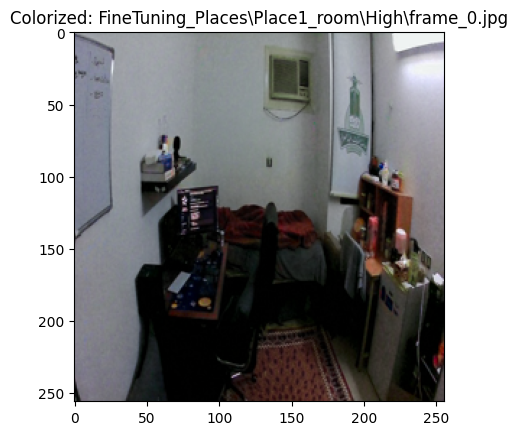

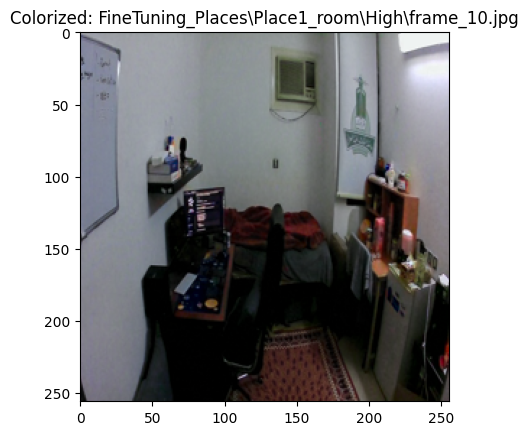

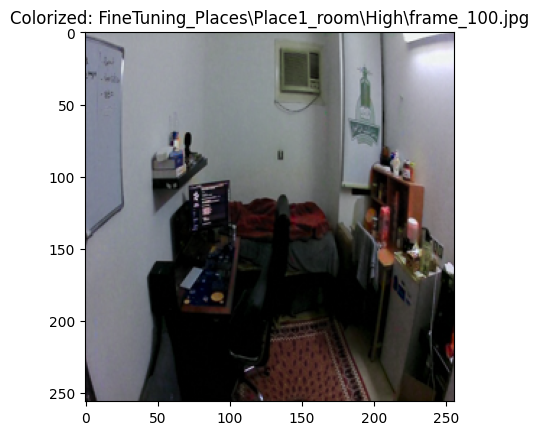

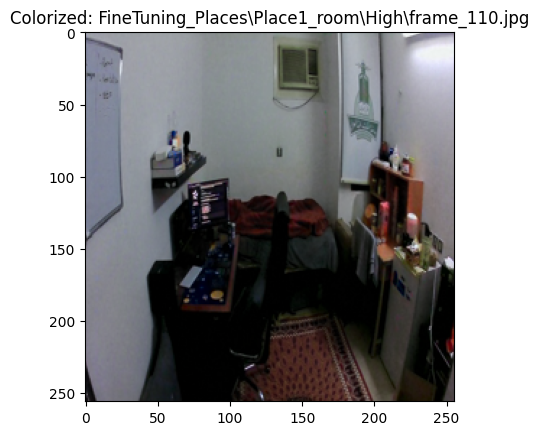

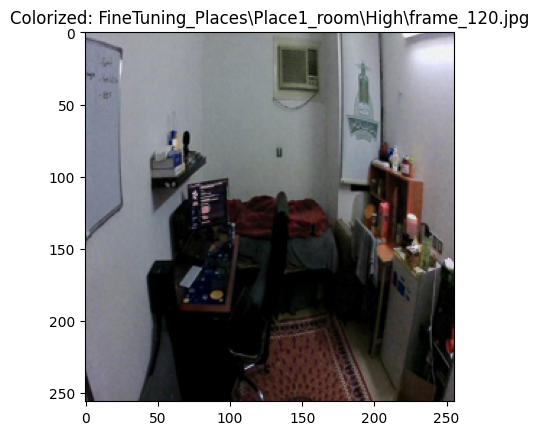

...

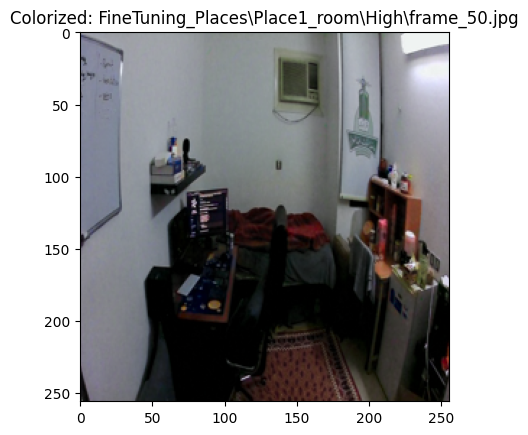

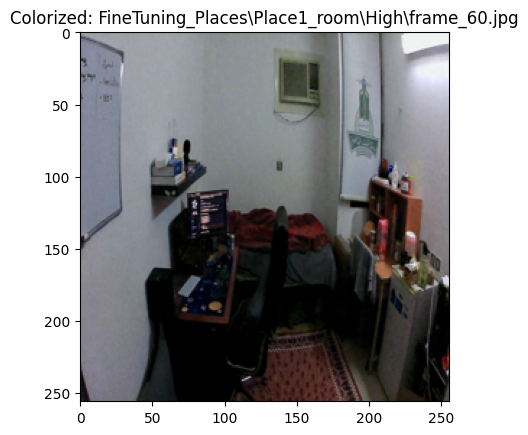

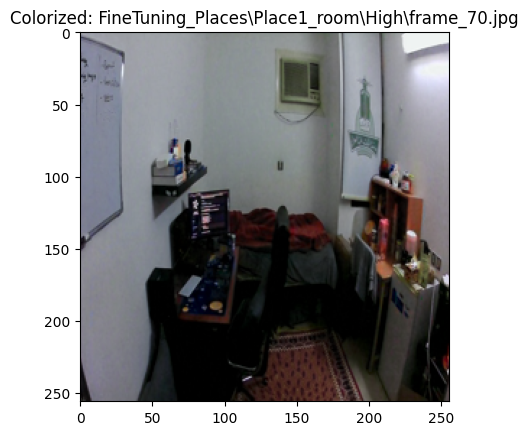

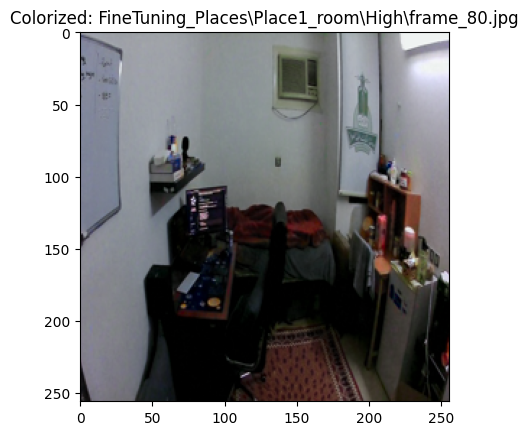

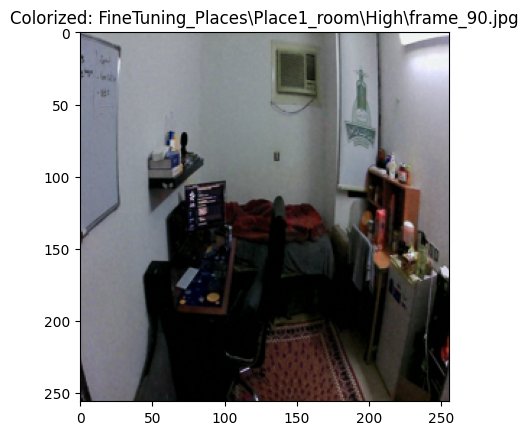

In [37]:
# Get a list of all image paths in the directory

image_paths = glob.glob(Test_images_dir)  # This will get all files regardless of their extension

# Filter out only the image extensions you mentioned
valid_extensions = ['png', 'jpeg', 'jpg', 'jfif']
image_paths = [path for path in image_paths if path.split('.')[-1].lower() in valid_extensions]

for path in image_paths:
    img = Image.open(path)
    img = img.resize((256, 256))

    # To make it between -1 and 1
    img = transforms.ToTensor()(img)[:1] * 2. - 1.

    model.eval()
    with torch.no_grad():
        preds = model.net_G(img.unsqueeze(0).to(device))

    colorized = lab_to_rgb(img.unsqueeze(0), preds.cpu())[0]

    # Display the colorized image
    plt.imshow(colorized)
    plt.title(f"Colorized: {path.split('/')[-1]}")
    plt.show()

# ONNX inference 

In [ ]:
# Load the ONNX model
session = onnxruntime.InferenceSession("model.onnx")
input_name = session.get_inputs()[0].name


image_paths = glob.glob(Test_images_dir) 
valid_extensions = ['png', 'jpeg', 'jpg', 'jfif']
image_paths = [path for path in image_paths if path.split('.')[-1].lower() in valid_extensions]

for path in image_paths:
    img = Image.open(path)
    img = img.resize((SIZE, SIZE))

    # To make it between -1 and 1
    img_tensor = transforms.ToTensor()(img)[:1] * 2. - 1.

    # Convert tensor to numpy array and adjust dimensions as needed
    img_numpy = np.array(img_tensor.unsqueeze(0))

    # Perform inference using ONNX Runtime
    preds = session.run(None, {input_name: img_numpy})

    # Assuming your lab_to_rgb function can handle numpy arrays, 
    # if not you may need to convert the output back to a tensor.
    colorized = lab_to_rgb(img_numpy, preds[0])  # preds is a list, so we use preds[0]

    # Display the colorized image
    plt.imshow(colorized)
    plt.title(f"Colorized: {path.split('/')[-1]}")
    plt.show()


# Optimized Threaded Inference for Real-time

# Extract frames from videos

In [ ]:
def extract_frames(video_path, output_folder):
    # Ensure the output folder exists
    if not os.path.exists(output_folder):
        os.makedirs(output_folder)
    
    # Open the video file
    vidcap = cv2.VideoCapture(video_path)
    
    # Total frames in the video
    total_frames = int(vidcap.get(cv2.CAP_PROP_FRAME_COUNT))
    
    # Loop through each frame
    for i in range(total_frames):
        success, image = vidcap.read()
        
        # Save every 10th frame
        if i % 10 == 0 and success:
            cv2.imwrite(os.path.join(output_folder, f'frame_{i}.jpg'), image)

# Example usage
video_paths = ["High.mp4", "Mid.mp4", "Low.mp4"]
for video_path in video_paths:
    extract_frames(video_path, video_path.split('.')[0])

